[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/guiwitz/MLCV/blob/main/notebooks/01-Handling_images.ipynb)

# 1. Handling images

Images in the Python world in general are simply multi-dimensional arrays (or matrices or tensors) of numbers. For example a regular image taken with a phone is composed of three 2D arrays of numbers (planes), one for each of Red, Green and Blue channels (RGB image). The same is true for medical scans (multiple planes of images), satellite imagery (multiple wavelengths), movies (4D images, RGB+time) etc.

In order to deploy Machine Learning approaches for computer vision, we of course need to know how to handle these structures in Python. In this chapter, we will learn to import images and do some basic processing.

In [1]:
# set path containing data folder or use default for Colab (/gdrive/My Drive)
local_folder = "../"
import urllib.request
urllib.request.urlretrieve('https://raw.githubusercontent.com/guiwitz/MLCV/main/notebooks/check_colab.py', 'check_colab.py')
from check_colab import set_datapath
colab, datapath = set_datapath(local_folder)

## Images as arrays

As mentioned above, images are simply matrices of numbers. Using Numpy we can for example generate a 2D image of noise:

In [15]:
import numpy as np

im_noise = np.random.randint(0,255,(30,30))

The most common way of representing simple 2D images is to use Matplotlib's ```imshow``` function. If one has more complex images, in particular n-dimensional ones, more specialized solutions like napari can be used.

In [16]:
import matplotlib.pyplot as plt

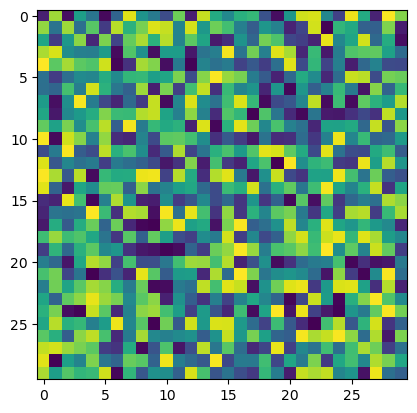

In [18]:
plt.imshow(im_noise);

## Importing images

Most of the time we do not generate images but rather import them from some source. There are multiple libraries able to open images in Python. Some are generalist and handle standard formats such as PNG, JPG etc. and some are designed to handle very specific formats e.g. from scientific domains such as microscopy or satellite imagery. Here we cover only the first category with few examples.

### imageio

[imageio](https://imageio.readthedocs.io/en/stable/index.html) is a library capable of reading and writing a very extensive list of image [formats](https://imageio.readthedocs.io/en/stable/formats/index.html). It is straightforward to use:

In [3]:
import imageio.v3 as iio

In [6]:
im = iio.imread(datapath.joinpath('data/woody_bulle.JPG'))

In [9]:
type(im)

numpy.ndarray

In [10]:
im.shape

(2448, 3264, 3)

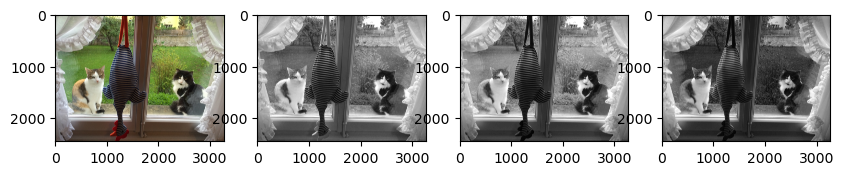

In [30]:
fig, ax = plt.subplots(1,4,figsize=(10,10))
ax[0].imshow(im)
ax[1].imshow(im[:,:,0], cmap='gray')
ax[2].imshow(im[:,:,1], cmap='gray')
ax[3].imshow(im[:,:,2], cmap='gray');

As we can see, the image is directly returned as a Numpy array and is an RGB image with 2448x3264 pixels. Instead of a path to a local file, we can also use a web address:

In [21]:
im2 = iio.imread('https://upload.wikimedia.org/wikipedia/commons/1/1f/African_elephant_male.jpg')

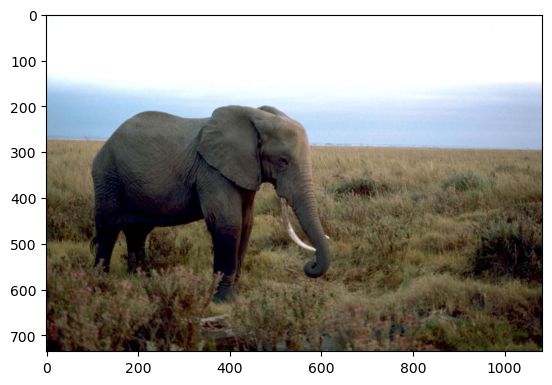

In [23]:
plt.imshow(im2);

Once an image has been created or processed, it can be saved again with imageio. Before saving, one has to make sure the format of the data is compatible with the image format. For example our previous random image has by default a float type that needs to be converted:

In [26]:
iio.imwrite(datapath.joinpath('data/random.png'), im_noise.astype(np.uint8))

Once we have imported an image, we often need to do some basic image processing. We present here two options: scikit-image a popular package in sciences with a very straightforward interface, and Pillow, a package centered on natural images (RGB) which is the format used in PyTorch.

## scikit-image

scikit-image is widely used in scientific computing. It implements a very wide choice of image processing algorithms and is very user friendly with a simple and consistent functional approach mostly following the pattern ```processed_image = f(image, option1, option2)```. We show here only a few essential tools that might be useful for pre- and post-processing.

### Importing images

Images of various formats can simply be imported with the ```skimage.io``` module as N-dimensional Numpy arrays. scikit-image doesn't implement its own readers, but typically relies on imageio and other more specialized readers.

In [27]:
import skimage

In [28]:
image = skimage.io.imread(datapath.joinpath('data/woody_bulle.JPG'))

In [31]:
image.shape

(2448, 3264, 3)

### Adjusting size, orientation

The ```skimage.transform``` submodule contains a large choice of functions to modify the image shape, size, orientation etc. All functions typically take an array as input with a series of options (e.g. rotation angle):

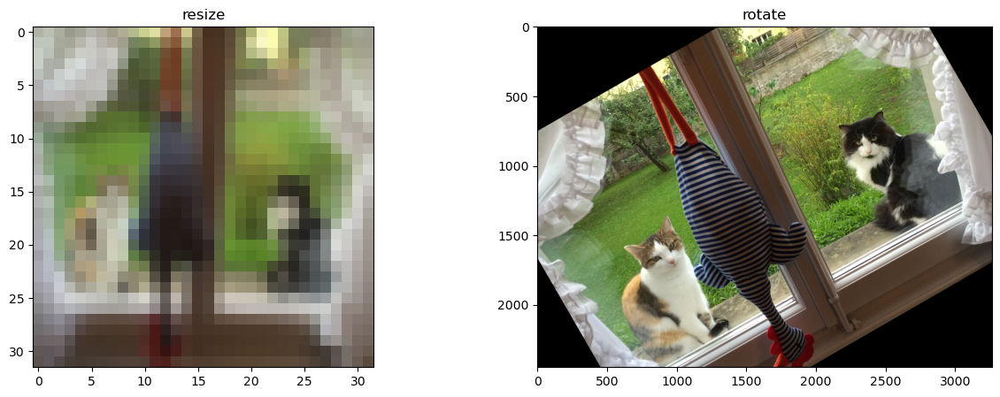

In [32]:
fig, ax = plt.subplots(1,2, figsize=(15,5))

ax[0].imshow(skimage.transform.resize(image, (32,32)))
ax[0].set_title('resize')
ax[1].imshow(skimage.transform.rotate(image,30))
ax[1].set_title('rotate');

### Adjust colors

scikit-image also has several function to adjust the image colors in the ```color``` module. For example one can turn a color image to gray scale:

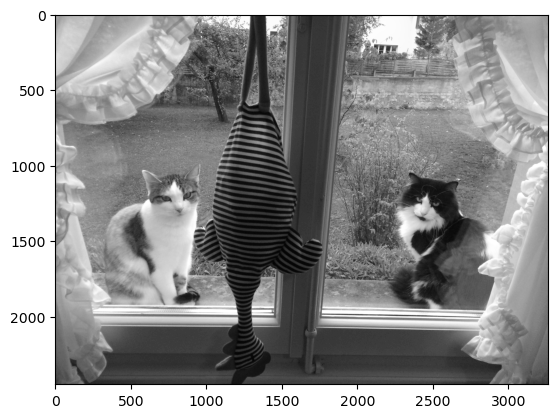

In [33]:
plt.imshow(skimage.color.rgb2gray(image), cmap='gray');

And many other functions are available from the ```exposure``` module. For example gamma correction:

In [34]:
image_gamma = skimage.exposure.adjust_gamma(image,0.5)

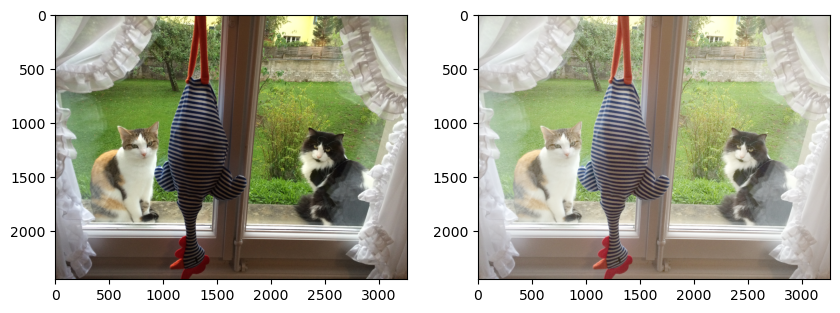

In [35]:
fig, ax = plt.subplots(1,2, figsize=(10,19))
ax[0].imshow(image)
ax[1].imshow(image_gamma);

### Changing types

To feed a neural network, one often has to change the image type e.g. to float type. scikit-image offers a series of functions to facilitate this. For example:

In [23]:
image_float = skimage.img_as_float32(image)
image_float.dtype

dtype('float32')

### Filtering

Finally, scikit-image offers a very wide choice of filters for smoothing, denoising, edge detection etc. Most can be found in the ```filters``` module. The latter also contains a series of thresholding methods that can be useful to produce masks.

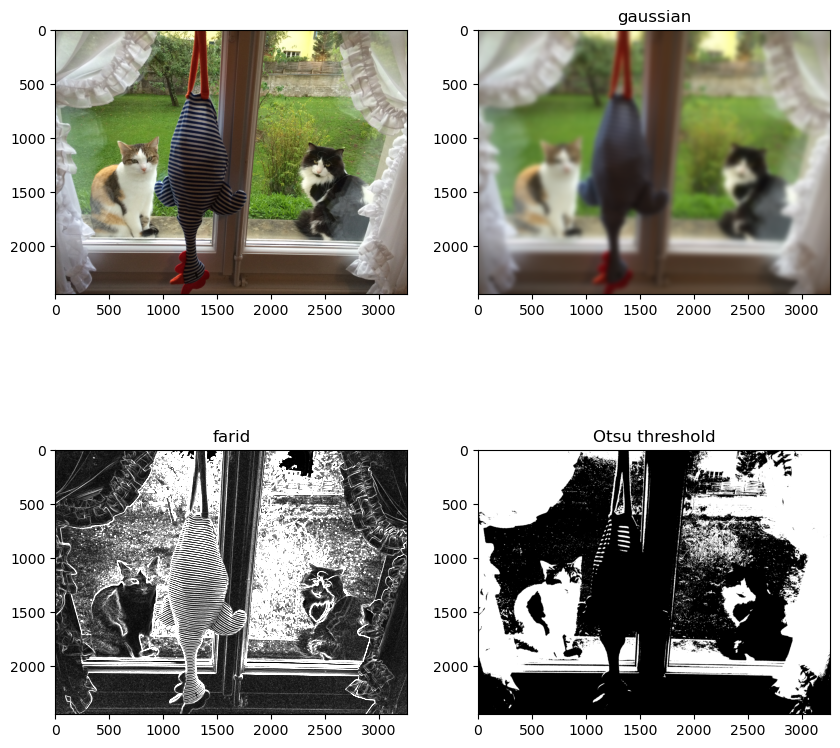

In [36]:
fig, ax = plt.subplots(2,2, figsize=(10,10))
ax[0,0].imshow(image)
ax[0,1].imshow(skimage.filters.gaussian(image, sigma=20, channel_axis=2))
ax[0,1].set_title('gaussian')
ax[1,0].imshow(skimage.filters.farid(image[:,:,0]), cmap='gray', vmin=0, vmax=0.02)
ax[1,0].set_title('farid')
threshold = skimage.filters.threshold_otsu(image[:,:,0])
ax[1,1].imshow(image[:,:,0] > threshold, cmap='gray')
ax[1,1].set_title('Otsu threshold');

### Saving images

Just like for import, we can use the ```ìo``` submodule to save images. Here again, scikit-image relies on other libraries such as imageio:

In [37]:
image_gauss2 = skimage.filters.gaussian(image, sigma=2, channel_axis=2)

In [39]:
skimage.io.imsave(datapath.joinpath('output/image_gauss2.jpg'), image_gauss2)

Lossy conversion from float64 to uint8. Range [0.005362774621907232, 1.0000000000000002]. Convert image to uint8 prior to saving to suppress this warning.


## Pillow

Pillow is similar to scikit-image, in that it allows to import, process and export images. It is less targeted towards scientific tasks, and doesn't contain e.g. segmentation algorithms. It is less straightforward to use than scikit-image, with a less pythonic mostly object oriented syntax, but as it is used in PyTorch, we introduce it here briefly. First we import the main ```Image``` modules that create image objects to which series of methods are attached:

In [40]:
from PIL import Image
import matplotlib.pyplot as plt

Now we can open an image (standard formats like jpg or tiff are handled). The result is a PIL image object which comes with a series of methods attached. Also one can easily display it without additional coding:

In [41]:
image = Image.open(datapath.joinpath('data/woody_bulle.JPG'))

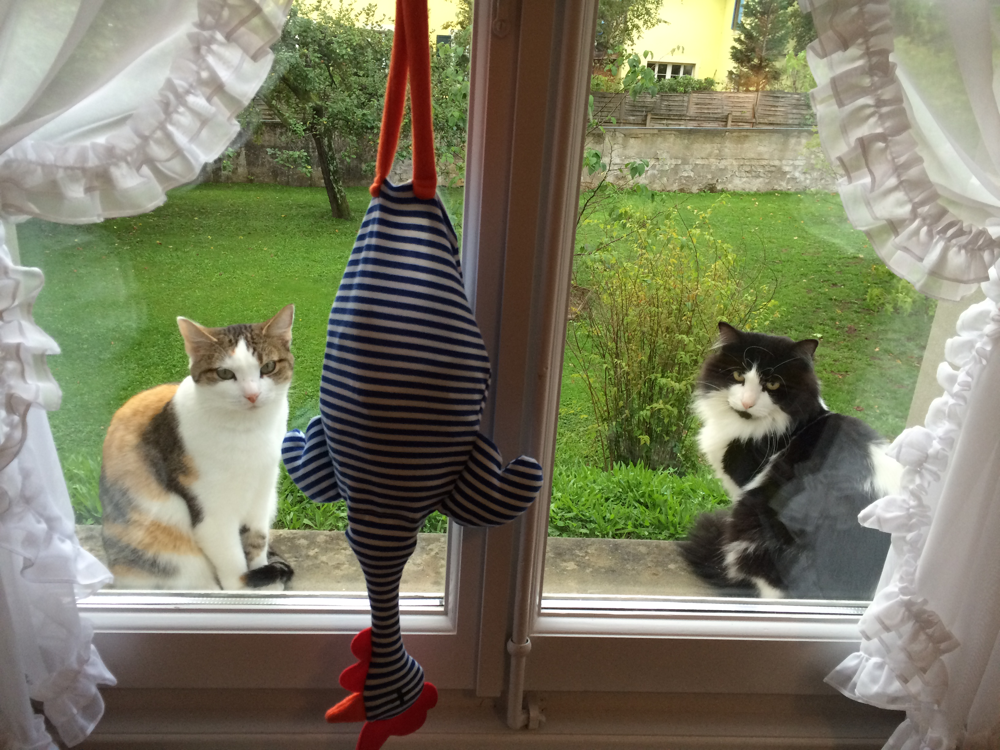

In [42]:
image

Underlying this image, we still have a Numpy array. We can convert using:

In [46]:
im_array = np.asarray(image)

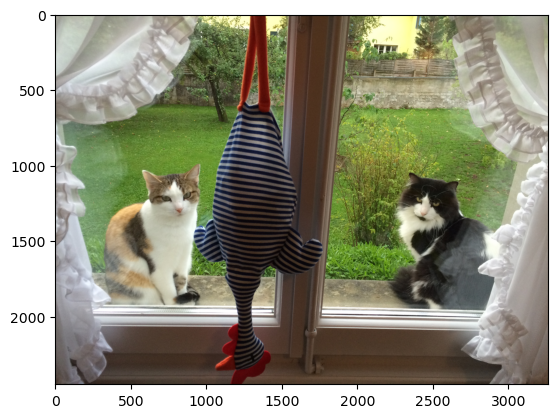

In [48]:
plt.imshow(im_array);

However, the PIL format is also compatible with Matplotlib, so if you need more complex plots (e.g. grids or superposition with other data), you can simply use the PIL image as a Numpy array:

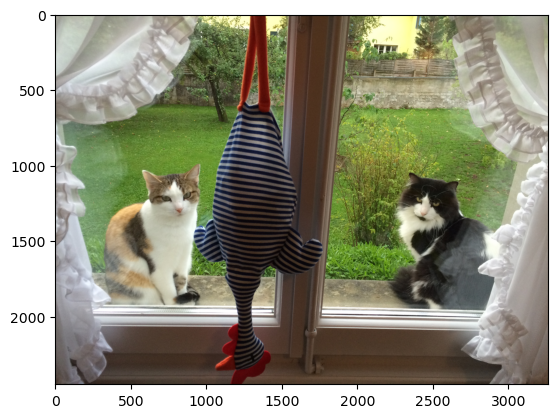

In [49]:
plt.imshow(image);

Alternatively, we can also turn a Numpy array into a PIL image:

In [83]:
im_noise_pil = Image.fromarray(im_noise)

TypeError: Cannot handle this data type: (1, 1), <i8

Here also we have to be careful with the type of the image pixels. The current type is int64 which is not handled by PIL. So we change the type to uint8 (given the bounds of the image value between 0-255): 

In [87]:
im_noise_pil = Image.fromarray(im_noise.astype(np.uint8))
im_noise_pil

### Adjusting size, orientation etc.
Many functions are then directly accessible as methods of the ```image``` object. A few examples here:
- Transposing
- Cropping
- Resizing
- Rotate

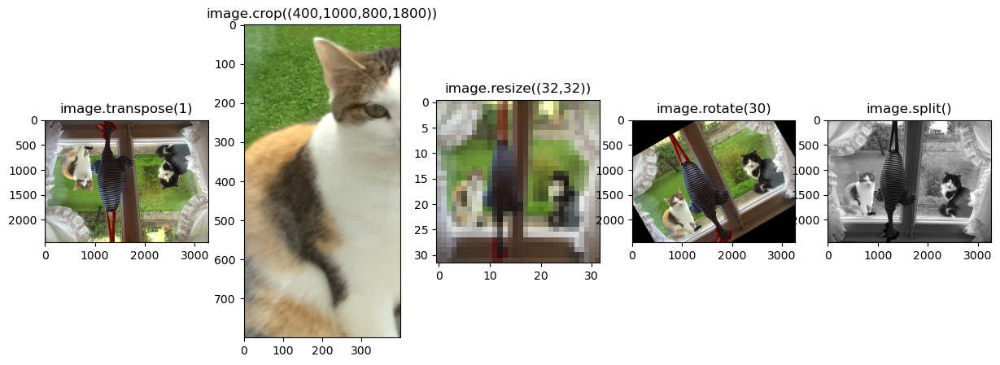

In [50]:
fig, ax = plt.subplots(1,5, figsize=(15,5))

ax[0].imshow(image.transpose(1))
ax[0].set_title('image.transpose(1)')
ax[1].imshow(image.crop((400,1000,800,1800)))
ax[1].set_title('image.crop((400,1000,800,1800))')
ax[2].imshow(image.resize((32,32)))
ax[2].set_title('image.resize((32,32))')
ax[3].imshow(image.rotate(30))
ax[3].set_title('image.rotate(30)')
r, g, b = image.split()
ax[4].imshow(g, cmap = 'gray')
ax[4].set_title('image.split()');

### Adjusting colors
Using the ```ImageEnhance``` module, you can also control typical image features like contrast, brightness etc. 

In [51]:
from PIL import ImageEnhance

In [52]:
enh = ImageEnhance.Brightness(image)
contr = ImageEnhance.Contrast(image)

In [53]:
enhanced = enh.enhance(1.3)
contrasted = contr.enhance(0.5)

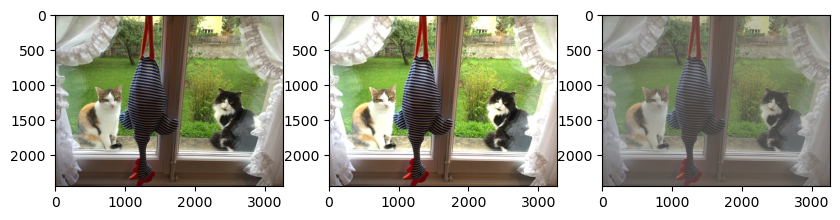

In [54]:
fig, ax = plt.subplots(1,3, figsize=(10,19))
ax[0].imshow(image)
ax[1].imshow(enhanced)
ax[2].imshow(contrasted);

### Filtering

Finally, PIL also offers some basic filtering capabilities. A very common example is Gaussian filtering (we will come back to filtering in a later notebook).

In [55]:
from PIL import ImageFilter

In [56]:
gauss_filter = ImageFilter.GaussianBlur(radius=20)

image_gauss = image.filter(gauss_filter)

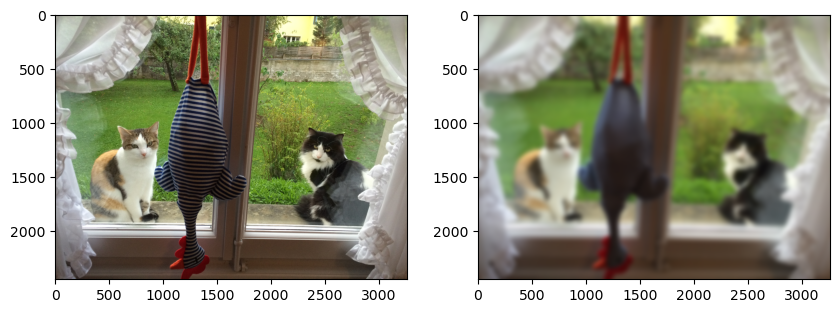

In [57]:
fig, ax = plt.subplots(1,2, figsize=(10,19))
ax[0].imshow(image)
ax[1].imshow(image_gauss);

### Saving images

You can easily save jpg images with:

In [58]:
image_gauss.save(datapath.joinpath('output/image_gauss.jpg'))

## Exercise

Import the image located at https://github.com/guiwitz/microfilm/raw/master/demodata/coli_nucl_ori_ter.tif. 
- What are the image dimensions ?
- The last two indices correspond to pixels. Plot a single plane of this dataset
- Filter the single plane using the Sobel filter from scikit-image
- Turn the single plane into a PIL image. Is it visible when you try to display it? If not any idea why?
- Using PIL, rotate the image by 30°
- Save the rotated image as a PNG